In [1]:
%load_ext autoreload
%autoreload 2

import scipy.io as sio
from dataclasses import dataclass
from typing import List, Tuple
import os
from dotenv import load_dotenv
load_dotenv()
import tidy3d as td
from tidy3d import web
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from natsort import natsorted
import numpy as np
import matplotlib.animation as animation
import xarray as xr
import h5py
import imageio
import matplotlib
import gc
import sys
import io
import matplotlib.colors as mcolors
import matplotlib.patches as patches
from scipy.optimize import curve_fit
import scipy.integrate


# Assuming /AutomationModule is in the root directory of your project
sys.path.append(os.path.abspath(rf'H:\phd stuff\tidy3d'))

from AutomationModule import * 

import AutomationModule as AM
plt.rcParams.update({'font.size': 14})  

tidy3dAPI = os.environ["API_TIDY3D_KEY"]
plt.rc('font', family='Arial')


In [2]:
file = rf"H:\phd stuff\tidy3d\output\LSU Data\transmission_different_permmitivities_thickness.h5"
with h5py.File(file, 'r') as h5f:
    data = {
            'transmission_right':h5f["transmission_right"][:],
            'name':h5f["name"],
            'nu(a/lambda)':h5f["nu(a/lambda)"][:],
            "freqs":h5f["raw_freqs(Hz)"][:],
            "sizes":h5f["sizes"][:],
            "cell_size":h5f["cell_size"],
            "a":h5f["a"],
            "eps":h5f["eps"][:]
                        
            }

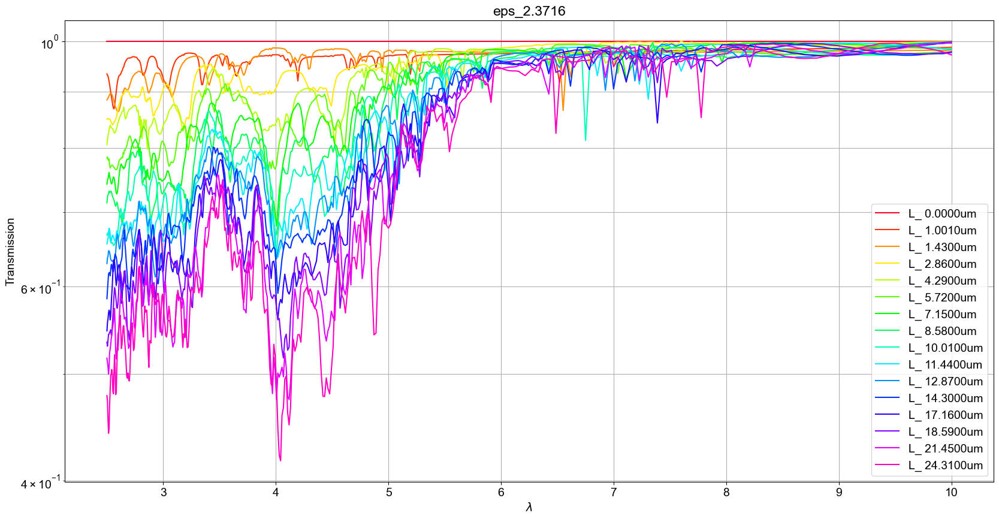

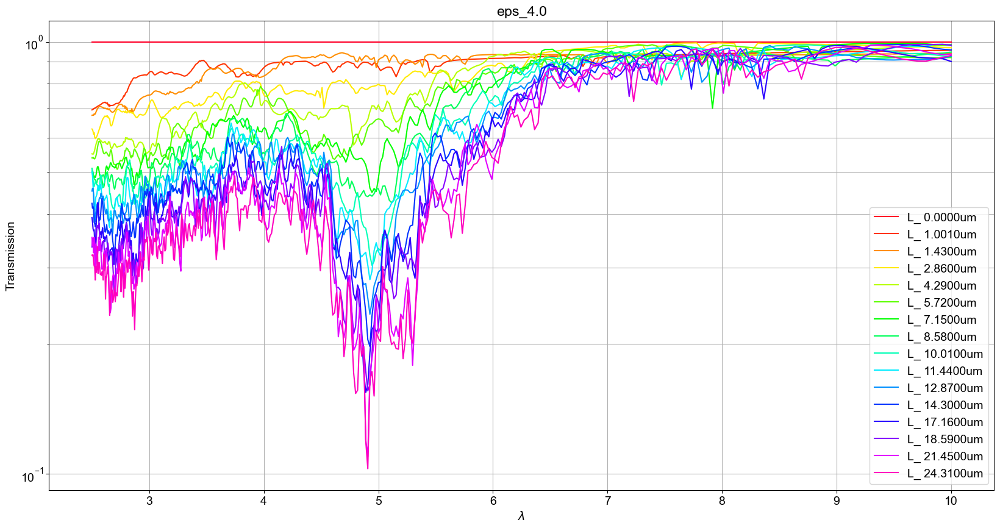

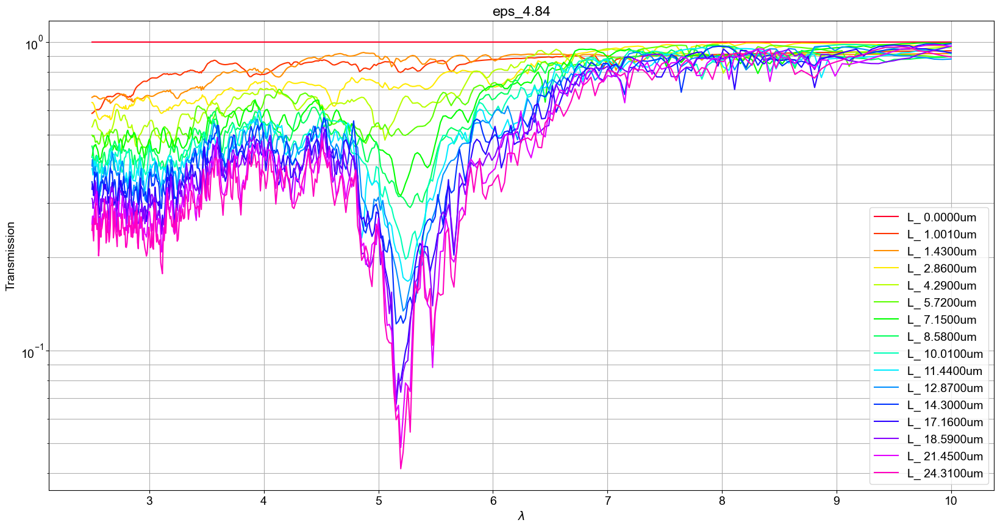

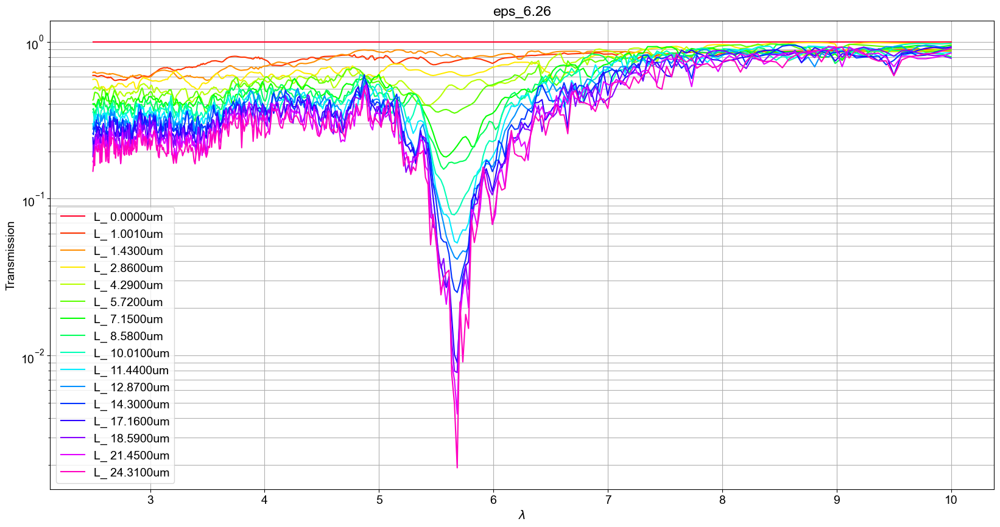

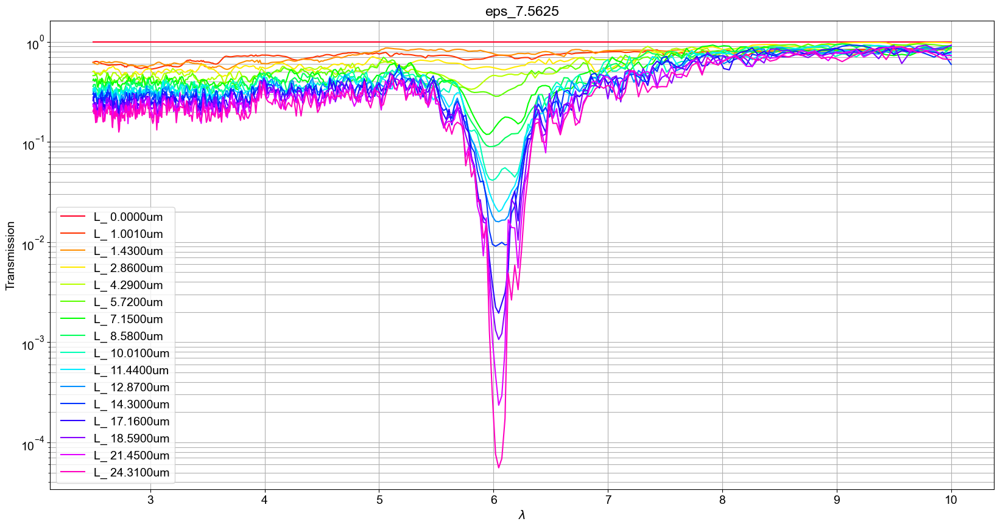

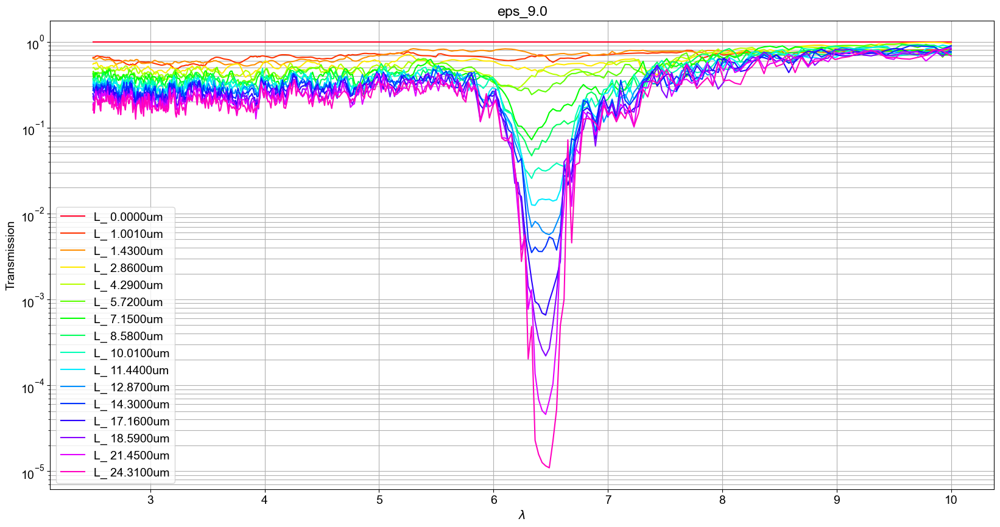

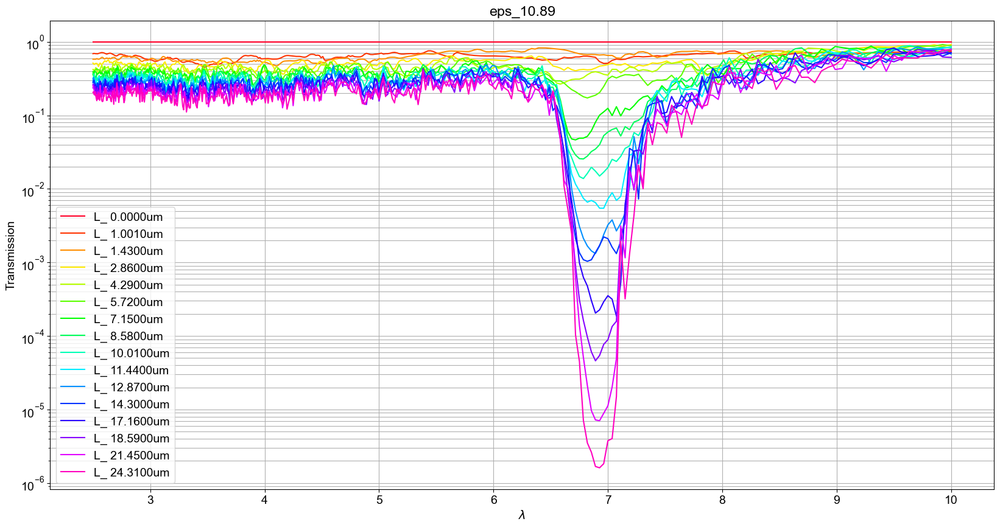

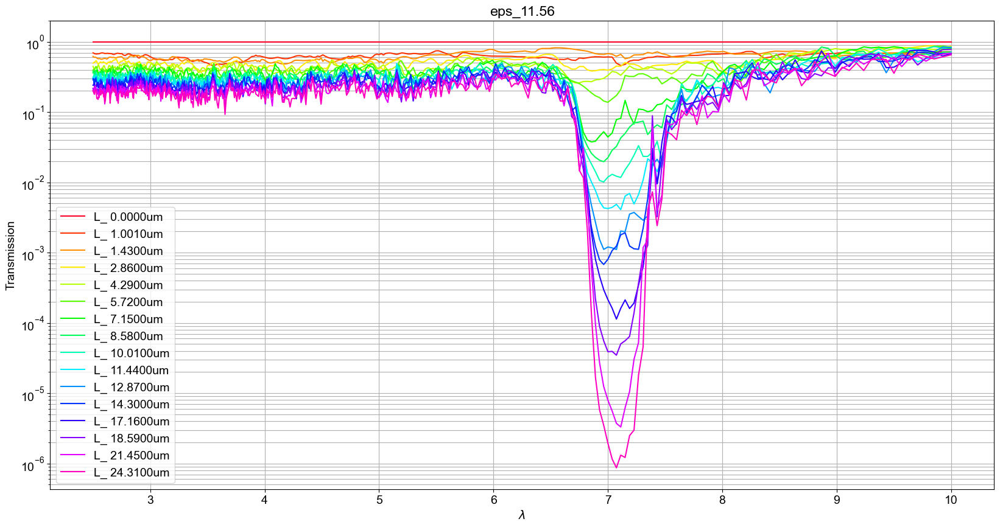

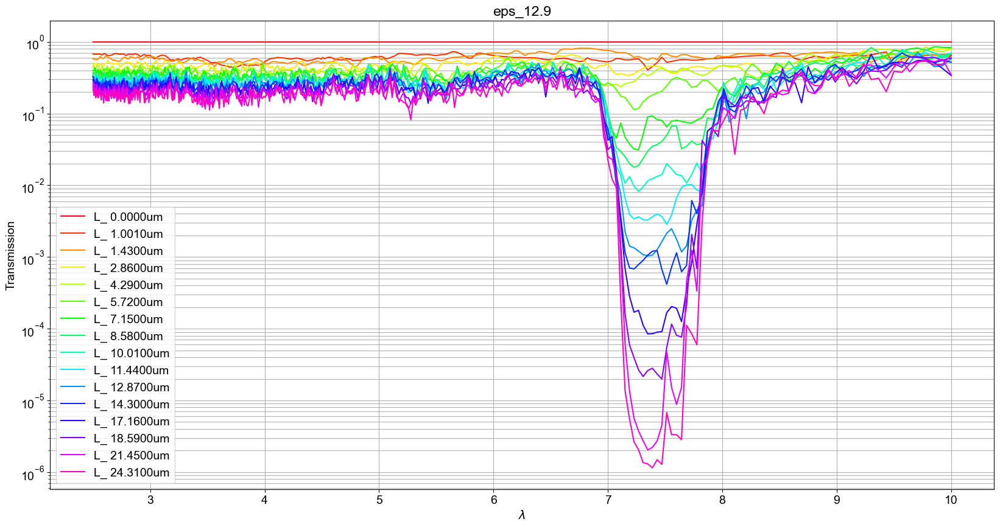

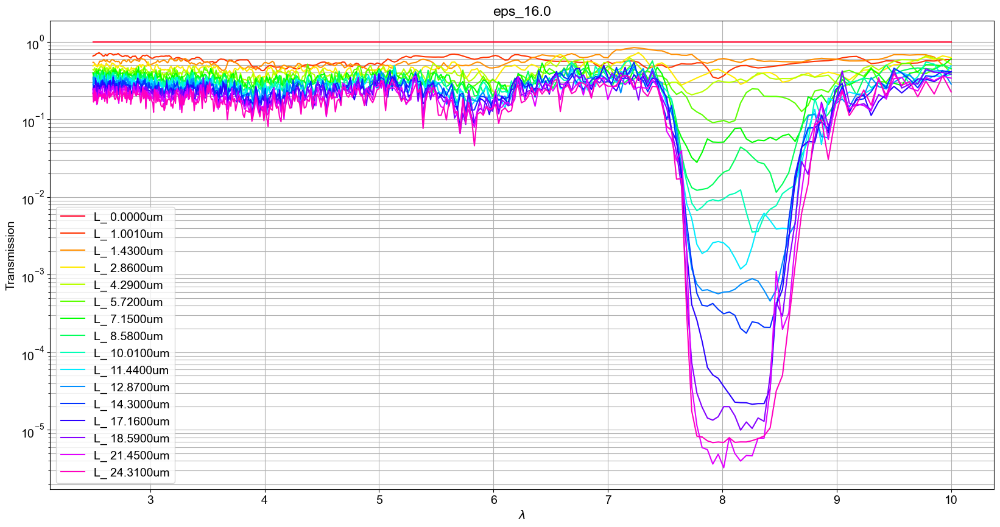

In [3]:
a=2.58
dir_plot = Path(rf"H:\phd stuff\tidy3d\output\LSU Data\ThicknessEpsVariations")
dir_plot.mkdir(parents=True,exist_ok=True)
colors = plt.cm.gist_rainbow(np.linspace(0, 1, len(data["sizes"])))
for i,eps in enumerate(data["eps"]):
    plt.figure(figsize=(20, 10))
    for j,size in enumerate(data["sizes"]):
        plt.plot(td.C_0/data["freqs"],data["transmission_right"][i,j,:],label=rf"L_{size*14.3 : .4f}um",color=colors[j])
        plt.legend()
        plt.yscale("log")

    plt.xlabel(rf"$\lambda$")
    plt.ylabel("Transmission")
    plt.grid(True,which="both")
    plt.title(f"eps_{eps}")
    # plt.savefig(rf"{dir_plot}\eps_{eps}.pdf")    
    # plt.close()
    plt.show()

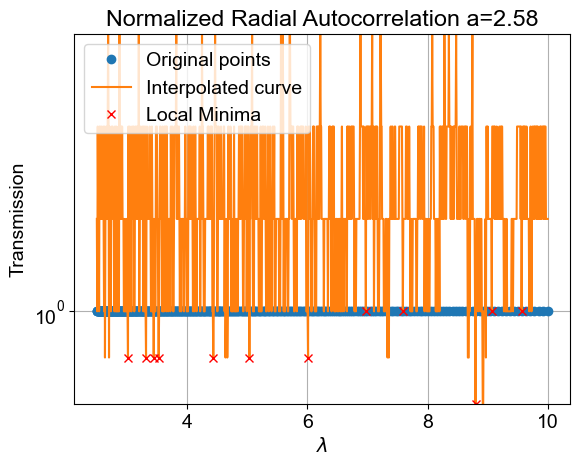

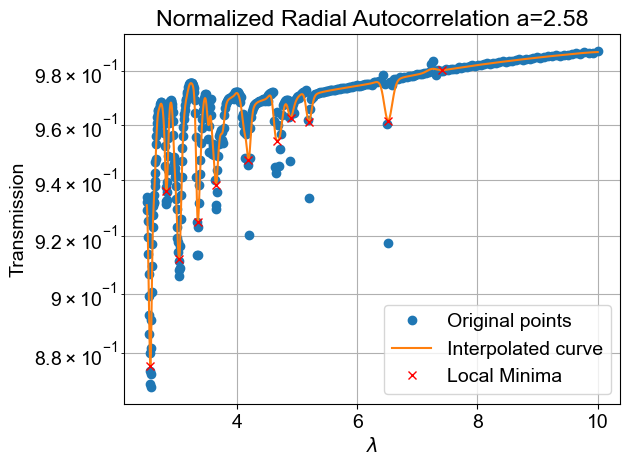

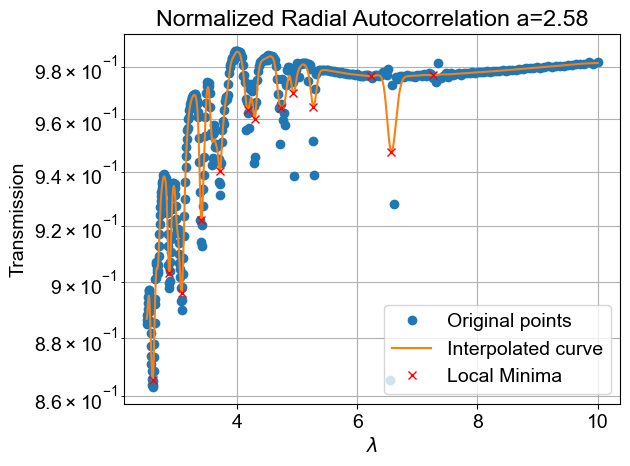

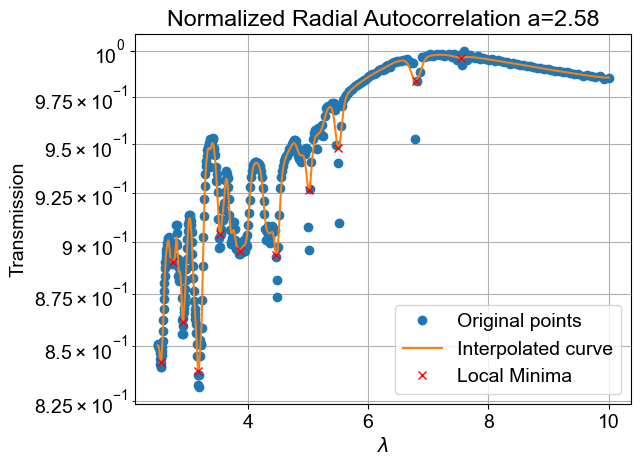

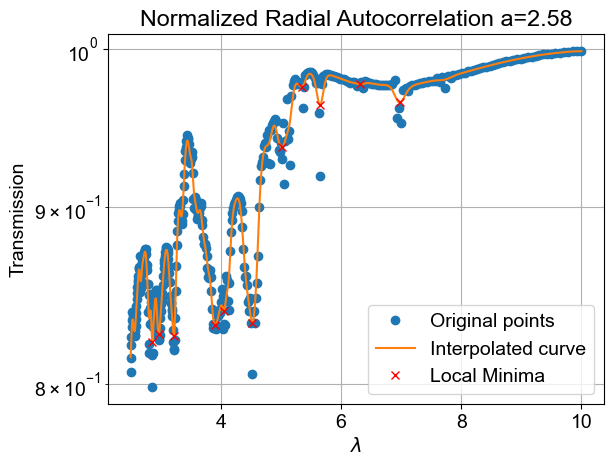

...

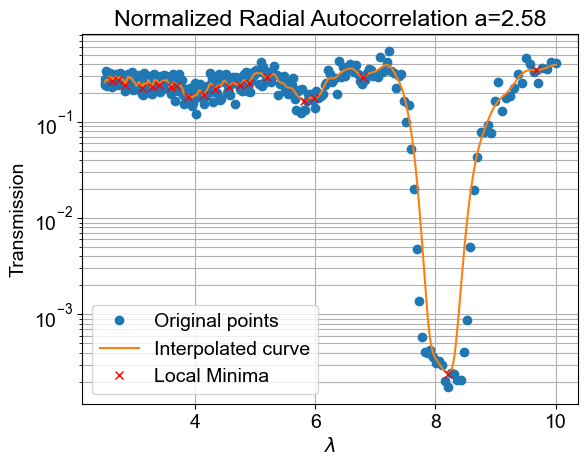

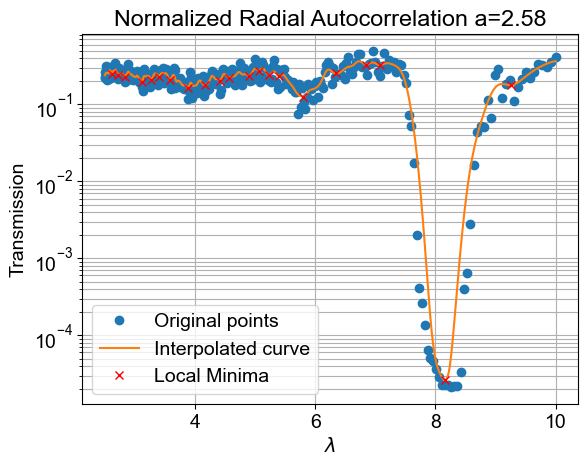

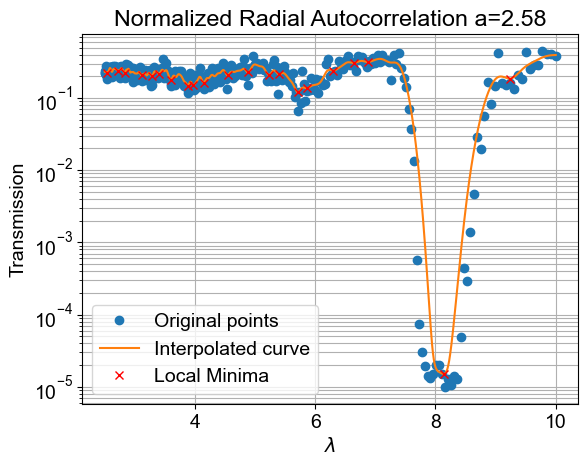

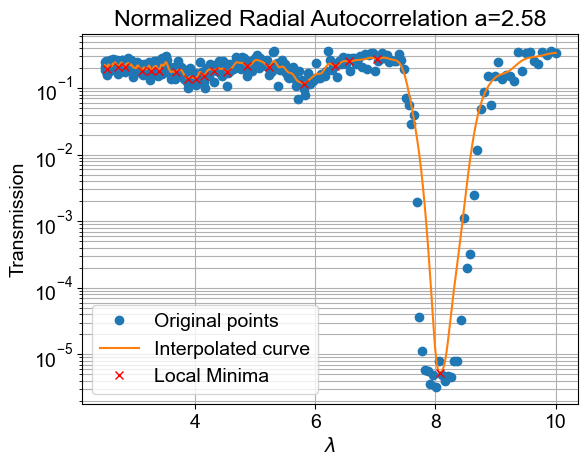

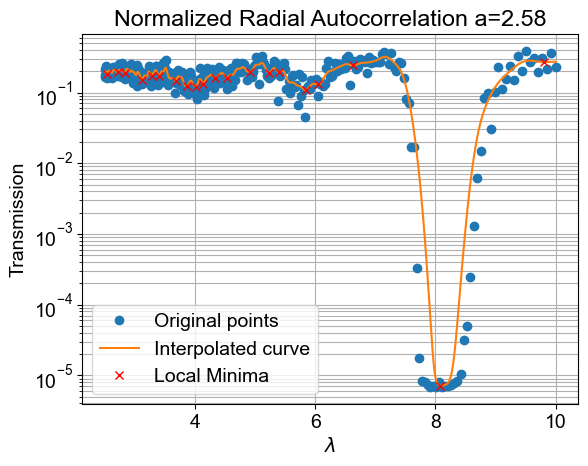

In [4]:
from scipy.interpolate import interp1d
from scipy.signal import argrelextrema
from scipy.ndimage import gaussian_filter1d
min_transmission = []
lambda_gaps = []

for i,eps in enumerate(data["eps"]):
    min_eps = []
    gap_eps = []
    for j,size in enumerate(data["sizes"]):
        # plt.figure(figsize=(20, 10))
        y=data["transmission_right"][i,j,:]
        y_smooth = gaussian_filter1d(y, sigma=2)
        f_interp = interp1d(td.C_0/data["freqs"], y_smooth, kind='cubic')  # 'cubic' or 'quadratic' for smooth curves
        x_fine = np.linspace((td.C_0/data["freqs"]).min(), (td.C_0/data["freqs"]).max(), 1000)
        y_fine = f_interp(x_fine)
        local_minima_indices = argrelextrema(y_fine, np.less,order=10)[0]
        min_eps.append(np.min(y_fine[local_minima_indices]))
        gap_eps.append((x_fine[local_minima_indices])[np.argmin(y_fine[local_minima_indices])])
        plt.plot((td.C_0/data["freqs"]), data["transmission_right"][i,j,:] , 'o', label='Original points')
        plt.plot(x_fine, y_fine, '-', label='Interpolated curve')
        plt.plot(x_fine[local_minima_indices], y_fine[local_minima_indices], 'rx', label='Local Minima')
        plt.xlabel(r'$\lambda$')
        plt.ylabel(r'Transmission')
        plt.title(f'Normalized Radial Autocorrelation a={a:.2f}')
        plt.yscale("log")
        plt.grid(True,which="both")
        plt.legend()
        plt.show()
        dir_plot = Path(rf"H:\phd stuff\tidy3d\output\LSU Data\Interpolation\n_rod_{np.sqrt(eps):.2f}")
        # dir_plot.mkdir(parents=True,exist_ok=True)
        # plt.savefig(rf"{dir_plot}\{rf"L_{size*14.3/a:.4f}a"}.pdf")
        # plt.close()
    min_transmission.append(min_eps)
    lambda_gaps.append(gap_eps)

min_transmission=np.array(min_transmission)
lambda_gaps=np.array(lambda_gaps)

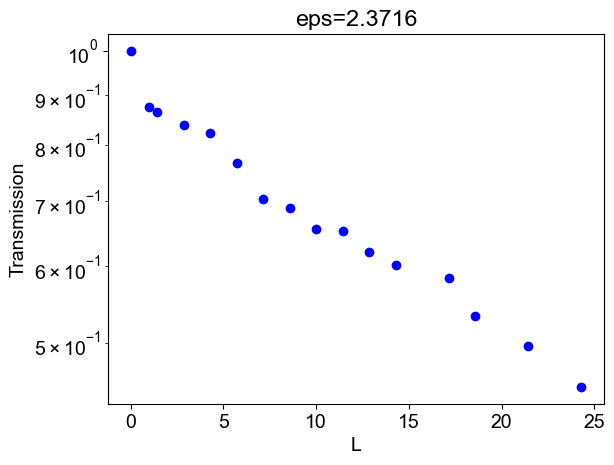

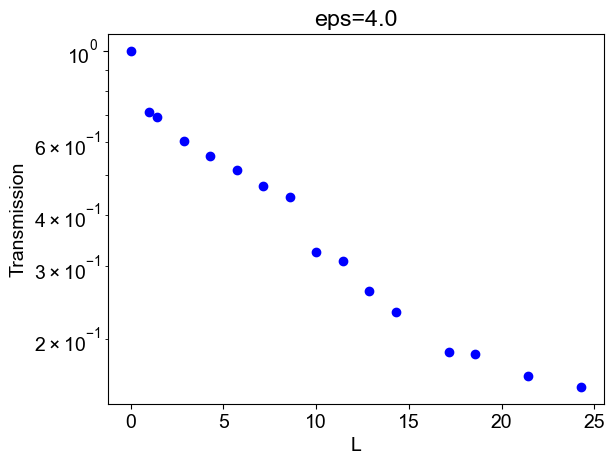

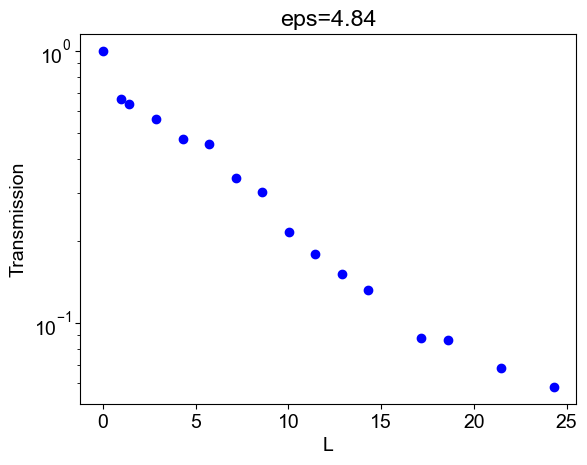

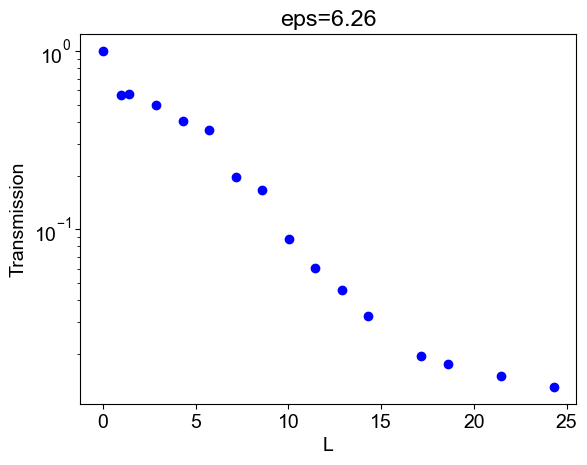

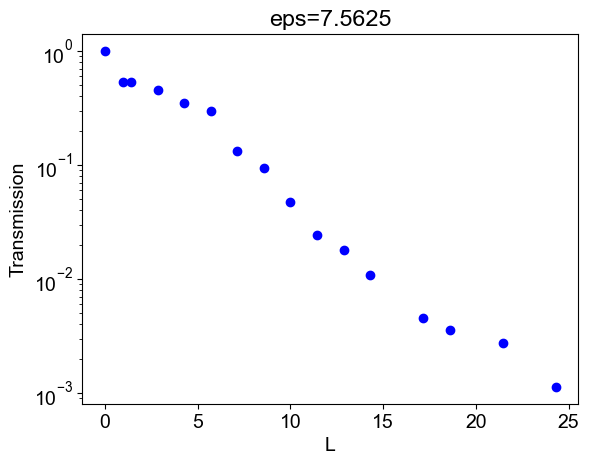

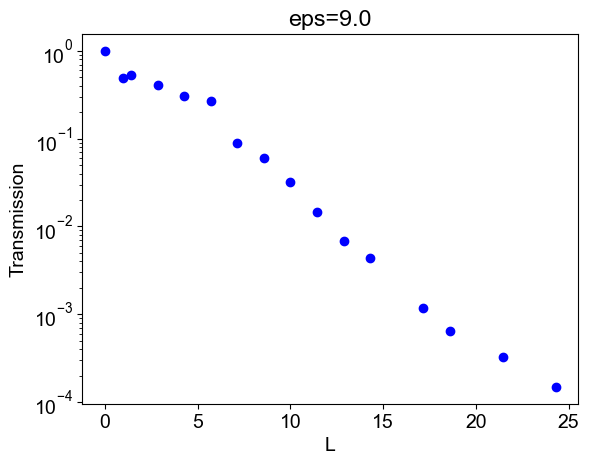

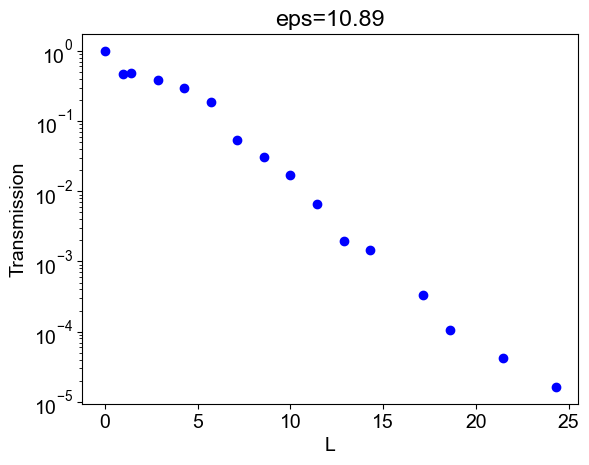

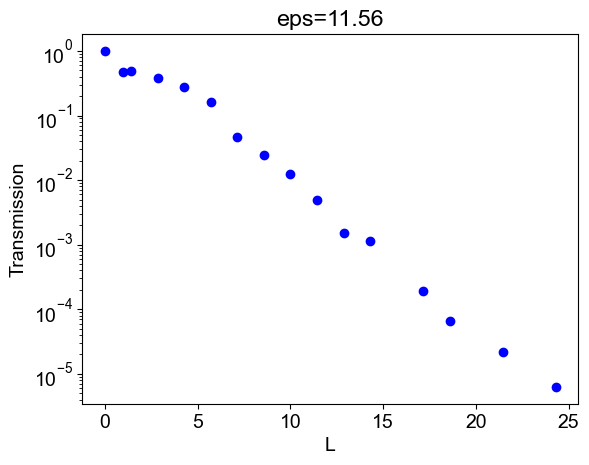

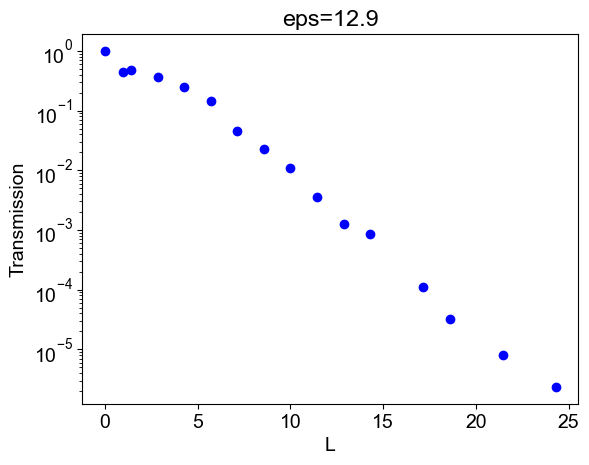

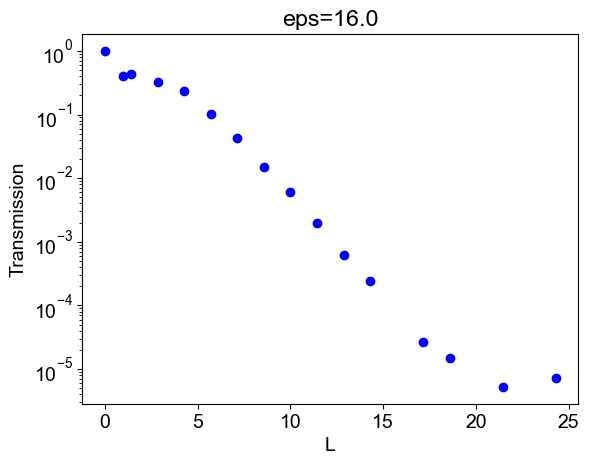

In [5]:
for i in range(min_transmission.shape[0]):  # Loop over the first axis (10)
    for j in range(min_transmission.shape[1]):  # Loop over second axis (16)
        item = min_transmission[i, j]  # Extract scalar index
        plt.scatter(14.3*data["sizes"][j], item, color="b")  
        plt.title(rf"eps={data['eps'][i]}")
        plt.xlabel("L")
        plt.ylabel("Transmission")
        plt.yscale("log")
        
    plt.show()  


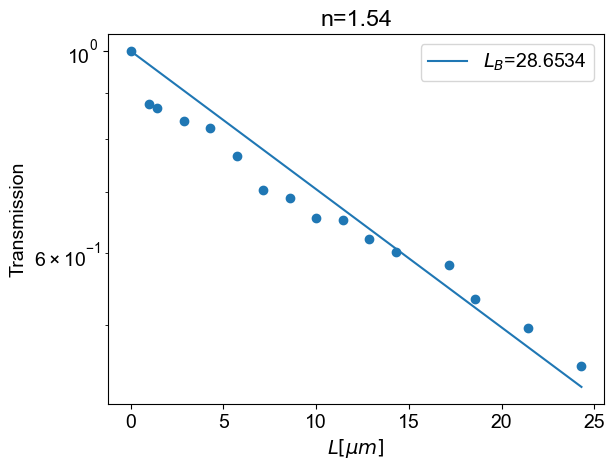

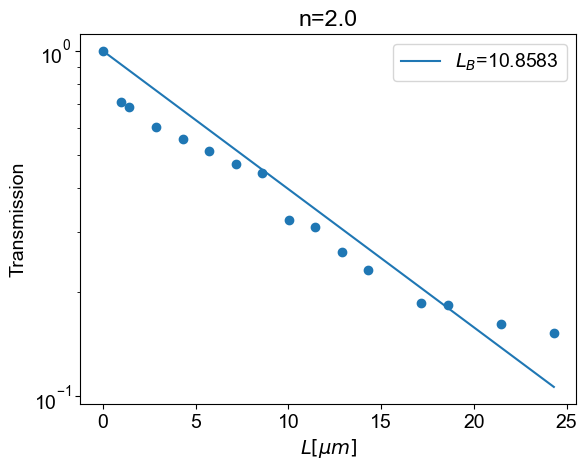

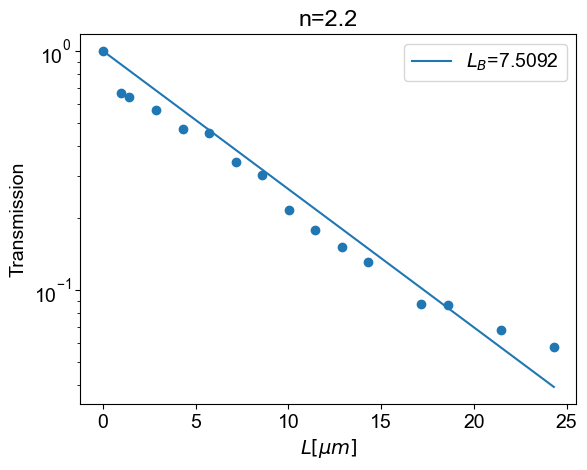

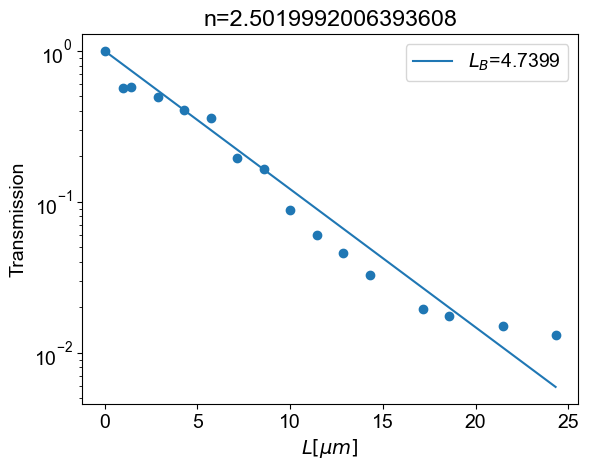

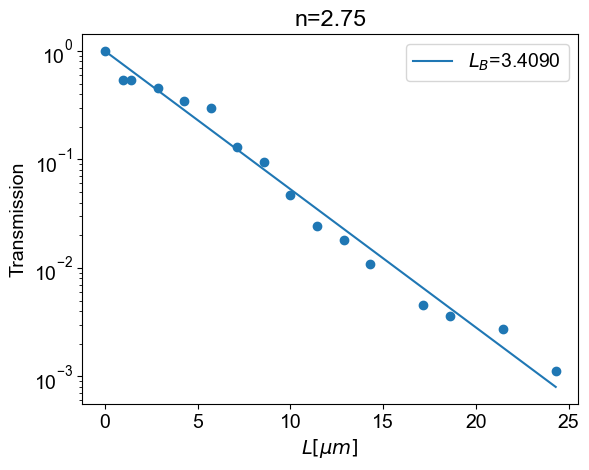

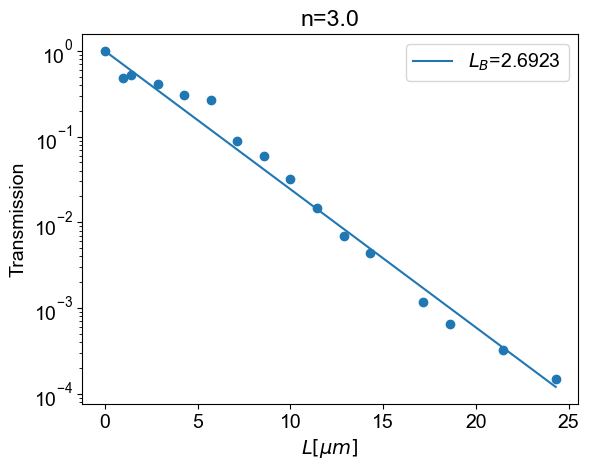

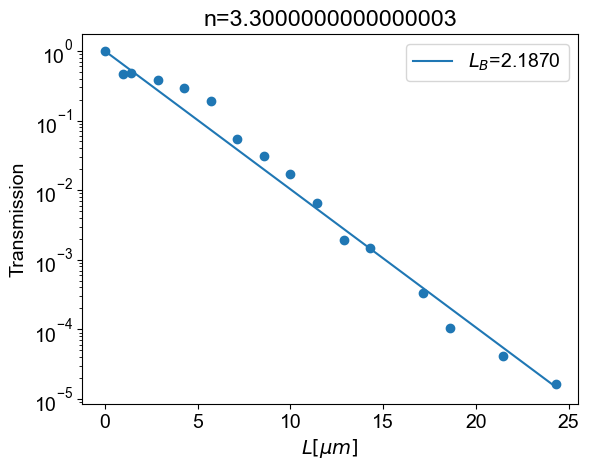

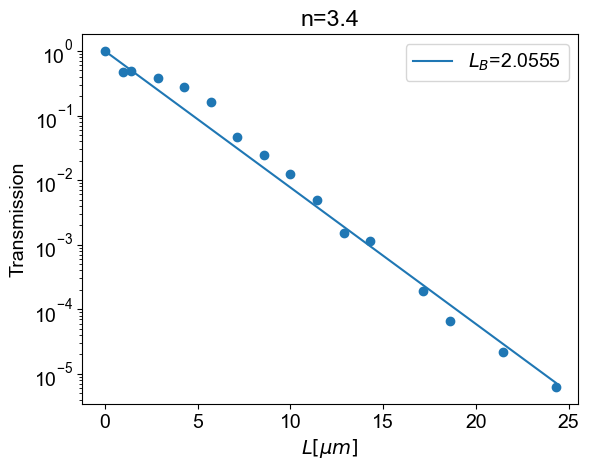

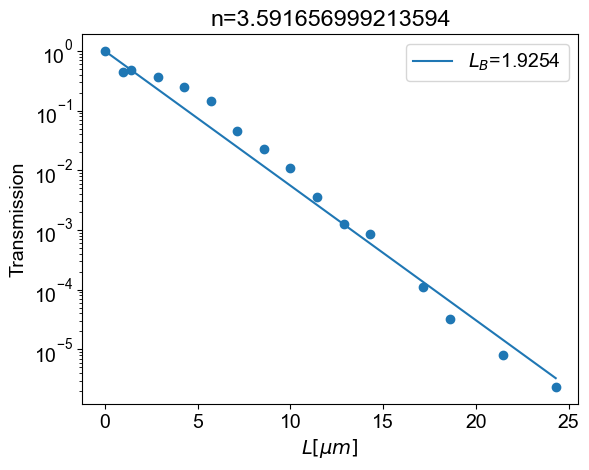

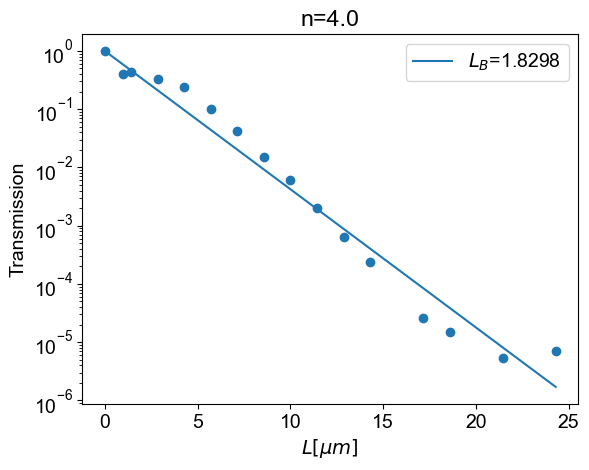

In [6]:
import jax
import jax.numpy as jnp
import jaxopt
def fit_decay(x,m):
    return ((-x)/m)
sizes = data["sizes"]*14.3
LB_values = []
for i,item in enumerate(min_transmission):
    #Fit Optimal decay
    model = lambda params,x: fit_decay(x,params[0])
    def loss_fn(params):
        y_pred = model(params, sizes[3:])
        return jnp.mean((y_pred - jnp.log(item[3:]))**2)
    
    initial_params = jnp.array([3], dtype=jnp.float32)
    optimizer = jaxopt.ScipyMinimize(fun=loss_fn,maxiter=3000)
    # Optimize the parameters
    result = optimizer.run(initial_params)
    m = (result.params)[0]


    ##plot 
    plt.scatter(sizes,item)
    plt.plot(sizes,np.exp(fit_decay(sizes,m)), label=rf"$L_B$={(m):.4f}")
    LB_values.append(m)
    plt.title(rf"n={np.sqrt(data["eps"][i])}")
    plt.xlabel(rf"$L[\mu m]$")
    plt.ylabel("Transmission")
    plt.yscale("log")
    plt.legend()
    plt.show()

LB_values=np.array(LB_values)

In [7]:
file_mpb = rf"bgw_list.h5"
bgw_elliptical = read_hdf5_as_dict(file_mpb)["Elliptical"]['0.3003']

C:\Users\HernandF\AppData\Local\Temp\ipykernel_4120\2621217514.py:2: RuntimeWarning: divide by zero encountered in divide
  Lb_from_bgw = 1/(2.9*np.pi *bgw_elliptical['gaps'])


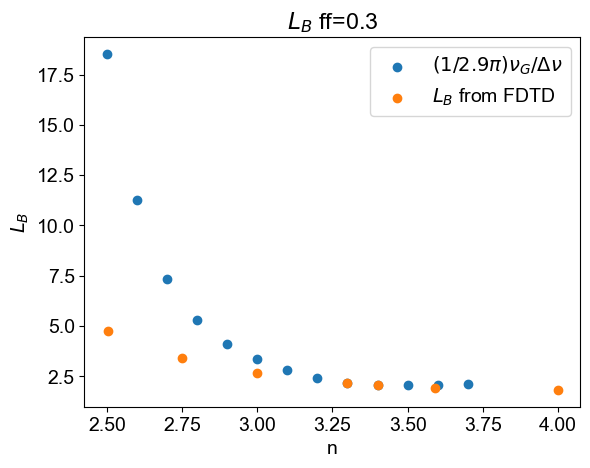

In [24]:
#Get LB relation 
Lb_from_bgw = 1/(2.9*np.pi *bgw_elliptical['gaps'])
plt.scatter(bgw_elliptical["n"],Lb_from_bgw,label=rf"$ (1/2.9 \pi) \nu_G/\Delta \nu $")
plt.scatter(np.sqrt(data["eps"])[3:],LB_values[3:],label =  rf"$L_B$ from FDTD")
plt.title(rf"$L_B$ ff=0.3")
plt.xlabel("n")
plt.ylabel("$L_B$")
plt.legend()
plt.savefig("L_B_ff_30.png")
plt.show()

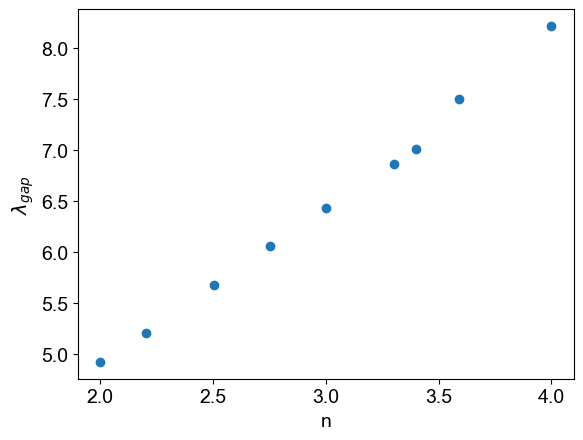

In [9]:
plt.scatter(np.sqrt(data["eps"])[1:],(lambda_gaps[1:,11]))
plt.xlabel(rf"n")
plt.ylabel(r"$\lambda_{gap}$")
plt.show()

In [10]:
data_txt = np.column_stack((np.sqrt(data["eps"]),LB_values))
data_txt_mpb = np.column_stack([bgw_elliptical["n"],bgw_elliptical["gaps"],bgw_elliptical["gap_center"]/14.3])

In [11]:
np.savetxt("20250822_L_B_Analysis_FDTD_ff_0p30.txt", 
           data_txt, fmt="%.18f", delimiter=" ", header="index_n L_B", comments="")
np.savetxt("20250822_Analysis_MPB_ff_0p30.txt", 
           data_txt_mpb, fmt="%.18f", delimiter=" ", header="index_n bgw gap_center", comments="")

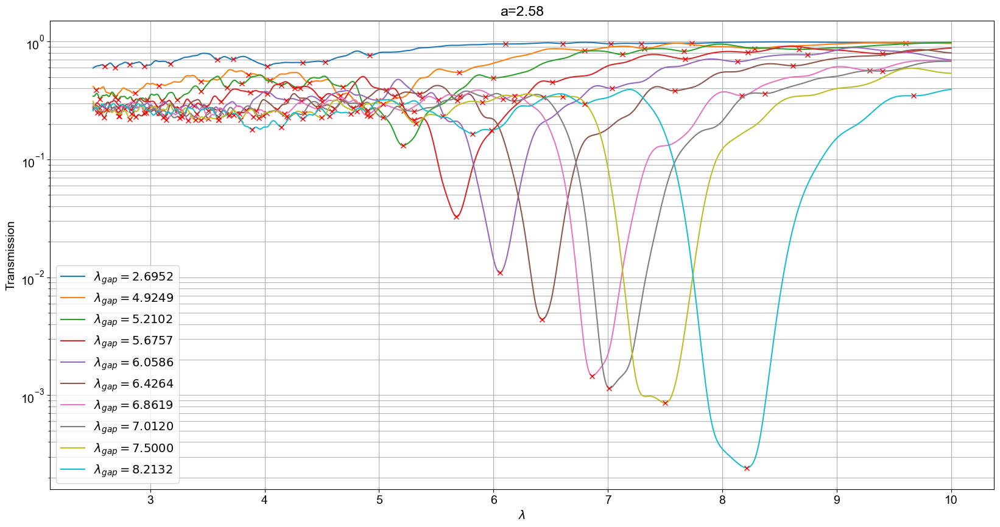

In [12]:
from scipy.interpolate import interp1d
from scipy.signal import argrelextrema
from scipy.ndimage import gaussian_filter1d

plt.figure(figsize=(20, 10))
for i,eps in enumerate(data["eps"]):
    for j,size in enumerate(data["sizes"]):
        if size ==1:
            y=data["transmission_right"][i,j,:]
            y_smooth = gaussian_filter1d(y, sigma=2)
            f_interp = interp1d(td.C_0/data["freqs"], y_smooth, kind='cubic')  # 'cubic' or 'quadratic' for smooth curves
            x_fine = np.linspace((td.C_0/data["freqs"]).min(), (td.C_0/data["freqs"]).max(), 1000)
            y_fine = f_interp(x_fine)
            local_minima_indices = argrelextrema(y_fine, np.less,order=10)[0]
            min_eps=(np.min(y_fine[local_minima_indices]))
            gap_eps=(x_fine[local_minima_indices])[np.argmin(y_fine[local_minima_indices])]
            plt.plot(x_fine, y_fine, '-',label=rf'$\lambda_{{gap}}={gap_eps:.4f}$')
            plt.plot(x_fine[local_minima_indices], y_fine[local_minima_indices], 'rx')
plt.xlabel(r'$\lambda$')
plt.ylabel(r'Transmission')
plt.title(f'a={a:.2f}')
plt.yscale("log")
plt.grid(True,which="both")
plt.legend()
plt.show()
